In [ ]:
from __future__ import print_function

## Import the basic modules.
import argparse
import numpy as np

## Import the PyTorch modules.
import torch
import torch.nn as nn
import torch.nn.functional as functional
import torch.optim as optim
from torchvision import transforms
from torch.autograd import Variable
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as transforms


In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms

In [ ]:
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

# Normalize the test set same as training set without augmentation
transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

**Part I-Download the CIFAR 10 dataset.**


In [ ]:
#Downloading the dataset

transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=256,
                                         shuffle=False, num_workers=2)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


In [ ]:
# Training images

import matplotlib.pyplot as plt
import numpy as np

# functions to show an image


def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

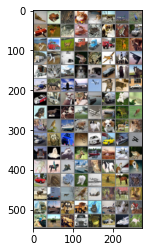

plane  frog  frog   cat


In [ ]:
dataiter = iter(trainloader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))

###Part 2
###Use the pretrained Resnet18 model (from trochvision) to extract features. Use thefeatures as inputs in a new multi-class logistic regression model (use nn Linear/nn.Module to define your model)

###(a) Describe any choices made and report test performance.

###(b) Display the top 5 correct predictions and the top 5 incorrect predictions in each class (show the images and the prediction labels) compactly. **bold text**

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
import torchvision.models as models
resnet18 = models.resnet18(pretrained=True)

for param in resnet18.parameters():
    param.requires_grad = False

In [ ]:
#Converting the o/p of Resnet(FC Layer) to 10 neurons
resnet18.fc=nn.Linear(512,10)

In [ ]:
#Different optimizers can be used. We have used SGD and Adam as optimizers
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet18.parameters(), lr=0.001, momentum=0.9)
#optimizer= optim.Adam(resnet18.parameters(), lr=0.00001)#, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)

In [ ]:
#Training the model
def train(epochs):
  loss_matrix=list()
  for e in range(0,epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):

      #print('aaa--->>')

      inputs, labels = data
      optimizer.zero_grad()
      outputs = resnet18(inputs)
      loss = criterion(outputs, labels)
      loss.backward()
      optimizer.step()

      running_loss += loss.item()

      '''if i % 300 == 0:
        print('[%d, %5d] loss: %.3f' % (epochs + 1, i + 1, running_loss / 300))
        running_loss = 0.0'''
    print('epoch=',e,'loss=',loss)
    loss_matrix.append(loss) 
  print('Finished Training.')

In [ ]:
#Training the model for 10 epochs
train(10)

epoch= 0 loss= tensor(1.6414, grad_fn=<NllLossBackward>)
epoch= 1 loss= tensor(1.7439, grad_fn=<NllLossBackward>)
epoch= 2 loss= tensor(1.4692, grad_fn=<NllLossBackward>)
epoch= 3 loss= tensor(1.4529, grad_fn=<NllLossBackward>)
epoch= 4 loss= tensor(1.4197, grad_fn=<NllLossBackward>)
epoch= 5 loss= tensor(1.5461, grad_fn=<NllLossBackward>)
epoch= 6 loss= tensor(1.5921, grad_fn=<NllLossBackward>)
epoch= 7 loss= tensor(1.4197, grad_fn=<NllLossBackward>)
epoch= 8 loss= tensor(1.3983, grad_fn=<NllLossBackward>)
epoch= 9 loss= tensor(1.4110, grad_fn=<NllLossBackward>)
Finished Training.


In [ ]:
def convert_to_imshow_format(image):
    # first convert back to [0,1] range from [-1,1] range
    image = image / 2 + 0.5
    image = image.numpy()
    # convert from CHW to HWC
    # from 3x32x32 to 32x32x3
    return image.transpose(1,2,0)

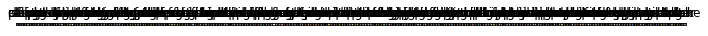

In [ ]:
dataiter = iter(testloader)
images, labels = dataiter.next()

fig, axes = plt.subplots(1, len(images), figsize=(12,2.5))
for idx, image in enumerate(images):
    axes[idx].imshow(convert_to_imshow_format(image))
    axes[idx].set_title(classes[labels[idx]])
    axes[idx].set_xticks([])
    axes[idx].set_yticks([])

In [ ]:
outputs = resnet18(images)

In [ ]:
sm = nn.Softmax(dim=1)
sm_outputs = sm(outputs)
print(sm_outputs)

tensor([[8.1842e-03, 3.5117e-03, 1.7453e-01,  ..., 5.3688e-02, 2.4033e-03,
         8.6567e-03],
        [9.2516e-02, 6.2569e-02, 3.5626e-04,  ..., 4.6899e-04, 7.0572e-01,
         1.3681e-01],
        [8.0444e-02, 9.6838e-02, 5.9959e-02,  ..., 5.2970e-02, 3.2310e-01,
         1.3198e-01],
        ...,
        [3.2524e-02, 2.1173e-01, 2.0073e-02,  ..., 7.5981e-02, 2.6709e-02,
         3.9729e-01],
        [6.5154e-03, 3.9808e-04, 3.6604e-01,  ..., 5.6945e-02, 2.3209e-04,
         2.6144e-04],
        [1.5200e-01, 5.6215e-02, 7.2029e-02,  ..., 1.1522e-01, 1.5999e-01,
         9.1352e-02]], grad_fn=<SoftmaxBackward>)


In [ ]:
#Calculating Test accuracy
total_correct = 0
total_images = 0
confusion_matrix = np.zeros([10,10], int)
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = resnet18(images)
        _, predicted = torch.max(outputs.data, 1)
        total_images += labels.size(0)
        total_correct += (predicted == labels).sum().item()
        for i, l in enumerate(labels):
            confusion_matrix[l.item(), predicted[i].item()] += 1 

model_accuracy = total_correct / total_images * 100
print('Model accuracy on {0} test images: {1:.2f}%'.format(total_images, model_accuracy))

Model accuracy on 10000 test images: 46.31%


In [ ]:
#Accuracy of each class
print('{0:10s} - {1}'.format('Category','Accuracy'))
for i, r in enumerate(confusion_matrix):
    print('{0:10s} - {1:.1f}'.format(classes[i], r[i]/np.sum(r)*100))

Category   - Accuracy
plane      - 48.6
car        - 45.3
bird       - 34.6
cat        - 38.6
deer       - 40.5
dog        - 37.1
frog       - 62.0
horse      - 54.3
ship       - 50.4
truck      - 51.7


##Part 2.B)
##Display the top 5 correct predictions and the top 5 incorrect predictions in
##each class (show the images and the prediction labels) compactly.

In [ ]:
df = pd.DataFrame(columns=["label","prediction","probability","image"])
for img, labl in tqdm_notebook(testloader):
   labl=labl.item()
   output = resnet18(img)
   pred = torch.argmax(output).item()
   pred_prob = output[0][labl].item()
   img = img / 2 + 0.5
   img = img.numpy()[0]
   df = df.append({"label":labl,"prediction":pred,"probability":pred_prob,"image":img},ignore_index=True)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


In [ ]:
df_worst = df.groupby(["label"]).apply(lambda x: x.sort_values(["probability"])).reset_index(drop=True).groupby(["label"]).head(5)
df_best = df.groupby(["label"]).apply(lambda x: x.sort_values(["probability"],ascending=False)).reset_index(drop=True).groupby(["label"]).head(5)

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

In [ ]:
mapping_dict = {0:"airplane",1:"automobile",2:"bird",3:"cat",4:"deer",5:"dog",6:"frog",7:"horse",8:"ship",9:"truck"}

In [ ]:
#Top 5 correct predictions in each class
df_best
#Here we see that only class 2 (bird) has low prediction probability in top 5 images. For all other classes top 5 images are predicted very accurately with high probability.

,label,prediction,probability,image
0,0,0,1.000000,"[[[0.62352943, 0.62352943, 0.62352943, 0.62352..."
1,0,0,1.000000,"[[[0.60784316, 0.60784316, 0.60784316, 0.60784..."
2,0,0,1.000000,"[[[0.9137255, 0.9137255, 0.9137255, 0.9137255,..."
3,0,0,1.000000,"[[[0.4392157, 0.4392157, 0.4392157, 0.4392157,..."
4,0,0,1.000000,"[[[0.2627451, 0.2627451, 0.2627451, 0.2627451,..."
1000,1,1,0.999994,"[[[0.29803923, 0.29803923, 0.29803923, 0.29803..."
1001,1,1,0.999994,"[[[0.11764705, 0.11764705, 0.11764705, 0.11764..."
1002,1,1,0.999992,"[[[0.7294118, 0.7294118, 0.7294118, 0.7294118,..."
1003,1,1,0.999991,"[[[0.05098039, 0.05098039, 0.05098039, 0.05098..."
1004,1,1,0.999991,"[[[0.32941177, 0.32941177, 0.32941177, 0.32941..."


##Images and respecive predicted labels for top 5 best predictions in each class

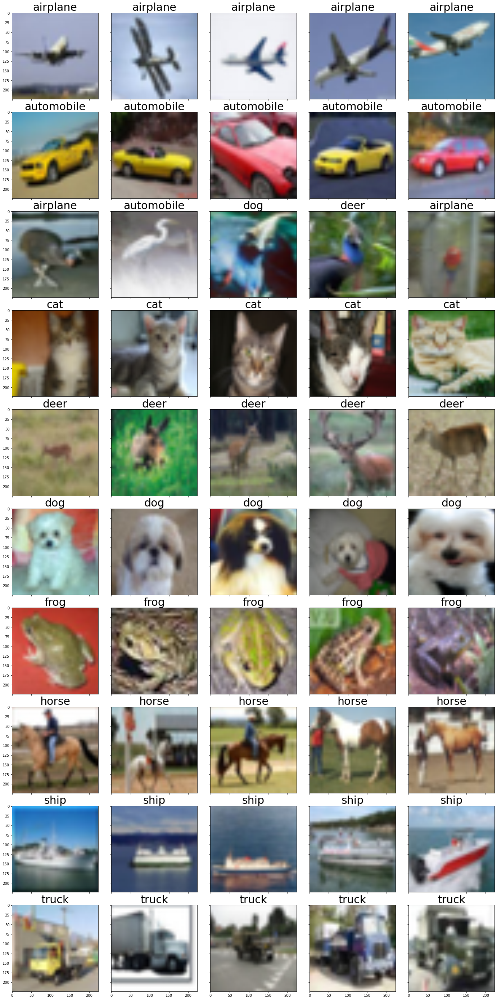

In [ ]:
fig = plt.figure(figsize=(50., 50.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(10, 5),  
                 axes_pad=0.5, 
                 )

for ax, row in zip(grid,df_best.iterrows() ):  
    ax.imshow(np.transpose(row[1]["image"],(1, 2, 0)))
    ax.set_title(mapping_dict[row[1]["prediction"]],{"fontsize":30})
plt.show()

In [ ]:
#Top 5 worst predictions in each class
df_worst

,label,prediction,probability,image
0,0,8,1.625210e-08,"[[[0.52156866, 0.52156866, 0.52156866, 0.52156..."
1,0,8,5.571416e-06,"[[[0.78039217, 0.78039217, 0.78039217, 0.78039..."
2,0,6,1.673444e-05,"[[[0.4392157, 0.4392157, 0.4392157, 0.4392157,..."
3,0,8,2.108242e-05,"[[[0.50980395, 0.50980395, 0.50980395, 0.50980..."
4,0,8,3.983220e-05,"[[[0.6039216, 0.6039216, 0.6039216, 0.6039216,..."
1000,1,7,4.173183e-04,"[[[0.9843137, 0.9843137, 0.9843137, 0.9843137,..."
1001,1,7,6.987356e-04,"[[[0.7490196, 0.7490196, 0.7490196, 0.7490196,..."
1002,1,0,7.401488e-04,"[[[0.7411765, 0.7411765, 0.7411765, 0.7411765,..."
1003,1,6,8.779694e-04,"[[[0.24313724, 0.24313724, 0.24313724, 0.24313..."
1004,1,6,9.227872e-04,"[[[0.8862745, 0.8862745, 0.8862745, 0.8862745,..."


##Images and respecive predicted labels for top 5 worst predictions in each class

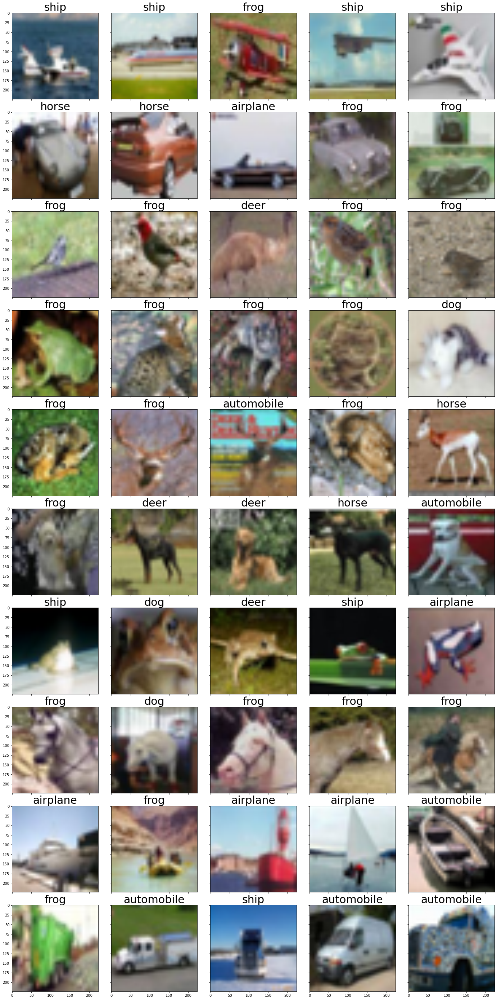

In [ ]:
fig = plt.figure(figsize=(50., 50.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(10, 5),  
                 axes_pad=0.5, 
                 )

for ax, row in zip(grid,df_worst.iterrows() ):  
    ax.imshow(np.transpose(row[1]["image"],(1, 2, 0)))
    ax.set_title(mapping_dict[row[1]["prediction"]],{"fontsize":30})

plt.axis("off")
plt.show()

So with the extracting features from the Resnet18 model we have achieved Test accuracy of 46 % on CIFAR10. Optimizer used is SGD with Learning rate of 0.01
Now, we will finetune the Resnet18 model to see if the accuracy of the model on CIFAR10 can be increasef

##Part 3
##Finetune the Resnet18 model’s parameters suitably and repeat parts (a) and (b) from above. Compare the performance of finetuning versus using extracted features. 

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
#This is the most important line of code for part 3. Since we are finetuning the Resnet's model parameters we have set "param.requires_grad" as True 
#as now it will finetune the Resnet model's parameters whereas in part 2 we just extracted features from Resnet 18 model and converted the output classes 
#of last layer to match the output classes of CIFAR10 which is 10 classes.
import torchvision.models as models
resnet18 = models.resnet18(pretrained=True)

for param in resnet18.parameters():
    param.requires_grad = True

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


In [ ]:
#Converting the o/p of Resnet(FC Layer) to 10 neurons as we have 10 classes in output of CIFAR10
resnet18.fc=nn.Linear(512,10)

In [ ]:
import torch.optim as optim

criterion = nn.CrossEntropyLoss()
#optimizer = optim.SGD(resnet18.parameters(), lr=0.001, momentum=0.9)
optimizer= optim.Adam(resnet18.parameters(), lr=0.001)#, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)

In [ ]:
def train(epochs):
  loss_matrix=list()
  for e in range(epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader):

      #print('aaa--->>')

      inputs, labels = data
      optimizer.zero_grad()
      outputs = resnet18(inputs)
      loss = criterion(outputs, labels)
      loss.backward()
      optimizer.step()

      running_loss += loss.item()

      '''if i % 300 == 0:
        print('[%d, %5d] loss: %.3f' % (epochs + 1, i + 1, running_loss / 300))
        running_loss = 0.0'''
    print('epoch=',e,'loss=',loss)
    loss_matrix.append(loss) 
  print('Finished Training.')

In [ ]:
#Training the model for 5 epochs
train(15)

epoch= 0 loss= tensor(0.7294, grad_fn=<NllLossBackward>)
epoch= 1 loss= tensor(0.8193, grad_fn=<NllLossBackward>)
epoch= 2 loss= tensor(0.4802, grad_fn=<NllLossBackward>)
epoch= 3 loss= tensor(0.5569, grad_fn=<NllLossBackward>)
epoch= 4 loss= tensor(0.2146, grad_fn=<NllLossBackward>)
epoch= 5 loss= tensor(0.3088, grad_fn=<NllLossBackward>)
epoch= 6 loss= tensor(0.0896, grad_fn=<NllLossBackward>)
epoch= 7 loss= tensor(0.1809, grad_fn=<NllLossBackward>)
epoch= 8 loss= tensor(0.1591, grad_fn=<NllLossBackward>)
epoch= 9 loss= tensor(0.1404, grad_fn=<NllLossBackward>)
epoch= 10 loss= tensor(0.1216, grad_fn=<NllLossBackward>)
epoch= 11 loss= tensor(0.1467, grad_fn=<NllLossBackward>)
epoch= 12 loss= tensor(0.3906, grad_fn=<NllLossBackward>)
epoch= 13 loss= tensor(0.1583, grad_fn=<NllLossBackward>)
epoch= 14 loss= tensor(0.0698, grad_fn=<NllLossBackward>)
Finished Training.


In [ ]:
def convert_to_imshow_format(image):
    # first convert back to [0,1] range from [-1,1] range
    image = image / 2 + 0.5
    image = image.numpy()
    # convert from CHW to HWC
    # from 3x32x32 to 32x32x3
    return image.transpose(1,2,0)

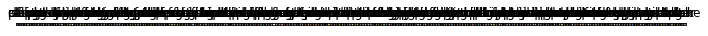

In [ ]:
dataiter = iter(testloader)
images, labels = dataiter.next()

fig, axes = plt.subplots(1, len(images), figsize=(12,2.5))
for idx, image in enumerate(images):
    axes[idx].imshow(convert_to_imshow_format(image))
    axes[idx].set_title(classes[labels[idx]])
    axes[idx].set_xticks([])
    axes[idx].set_yticks([])

In [ ]:
outputs = resnet18(images)

In [ ]:
sm = nn.Softmax(dim=1)
sm_outputs = sm(outputs)
print(sm_outputs)

tensor([[6.0934e-05, 9.4598e-04, 1.2807e-05,  ..., 9.6656e-06, 1.4232e-04,
         5.7982e-04],
        [3.3184e-02, 2.4646e-03, 2.4743e-05,  ..., 4.9417e-06, 9.6412e-01,
         1.0784e-04],
        [2.8417e-04, 3.3083e-03, 1.0010e-03,  ..., 1.8459e-04, 9.9399e-01,
         5.1268e-04],
        ...,
        [1.7306e-05, 5.5798e-03, 9.4740e-06,  ..., 8.1018e-06, 4.3286e-05,
         9.9425e-01],
        [1.4832e-04, 5.0876e-05, 7.4039e-02,  ..., 2.5463e-04, 1.5013e-04,
         1.6094e-04],
        [6.2268e-03, 1.7532e-02, 1.9470e-03,  ..., 1.3418e-04, 9.6171e-01,
         1.5078e-03]], grad_fn=<SoftmaxBackward>)


In [ ]:
#Testing on test images
total_correct = 0
total_images = 0
confusion_matrix = np.zeros([10,10], int)
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = resnet18(images)
        _, predicted = torch.max(outputs.data, 1)
        total_images += labels.size(0)
        total_correct += (predicted == labels).sum().item()
        for i, l in enumerate(labels):
            confusion_matrix[l.item(), predicted[i].item()] += 1 

model_accuracy = total_correct / total_images * 100
print('Model accuracy on {0} test images: {1:.2f}%'.format(total_images, model_accuracy))

Model accuracy on 10000 test images: 80.96%


In [ ]:
#Accuracy of each class
print('{0:10s} - {1}'.format('Category','Accuracy'))
for i, r in enumerate(confusion_matrix):
    print('{0:10s} - {1:.1f}'.format(classes[i], r[i]/np.sum(r)*100))

Category   - Accuracy
plane      - 79.6
car        - 90.5
bird       - 79.9
cat        - 68.7
deer       - 79.9
dog        - 69.0
frog       - 82.2
horse      - 85.0
ship       - 88.6
truck      - 86.2


##Display the top 5 correct predictions and the top 5 incorrect predictions in
##each class (show the images and the prediction labels) compactly.

In [ ]:
df = pd.DataFrame(columns=["label","prediction","probability","image"])
for img, labl in tqdm_notebook(testloader):
   labl=labl.item()
   output = resnet18(img)
   pred = torch.argmax(output).item()
   pred_prob = output[0][labl].item()
   img = img / 2 + 0.5
   img = img.numpy()[0]
   df = df.append({"label":labl,"prediction":pred,"probability":pred_prob,"image":img},ignore_index=True)

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/container.py:117: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)


In [ ]:
df_worst = df.groupby(["label"]).apply(lambda x: x.sort_values(["probability"])).reset_index(drop=True).groupby(["label"]).head(5)
df_best = df.groupby(["label"]).apply(lambda x: x.sort_values(["probability"],ascending=False)).reset_index(drop=True).groupby(["label"]).head(5)

In [ ]:
from mpl_toolkits.axes_grid1 import ImageGrid

In [ ]:
mapping_dict = {0:"airplane",1:"automobile",2:"bird",3:"cat",4:"deer",5:"dog",6:"frog",7:"horse",8:"ship",9:"truck"}

In [ ]:
#Top 5 correct predictions in each class
df_best
#Here we see that only class 4 (Deer) has low prediction probability in top 5 images. For all other classes top 5images are predicted very accurately with high probability.

,label,prediction,probability,image
0,0,0,1.000000,"[[[0.6784314, 0.6784314, 0.6784314, 0.6784314,..."
1,0,0,1.000000,"[[[0.031372547, 0.031372547, 0.031372547, 0.03..."
2,0,0,1.000000,"[[[0.67058825, 0.67058825, 0.67058825, 0.67058..."
3,0,0,1.000000,"[[[0.32156864, 0.32156864, 0.32156864, 0.32156..."
4,0,0,1.000000,"[[[0.85490197, 0.85490197, 0.85490197, 0.85490..."
1000,1,1,1.000000,"[[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0..."
1001,1,1,1.000000,"[[[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0..."
1002,1,1,1.000000,"[[[0.3647059, 0.3647059, 0.3647059, 0.3647059,..."
1003,1,1,1.000000,"[[[0.2901961, 0.2901961, 0.2901961, 0.2901961,..."
1004,1,1,1.000000,"[[[0.37254903, 0.37254903, 0.37254903, 0.37254..."


##**Plotting Images for Top 5 correct predictions in each class and respective predicted labels **

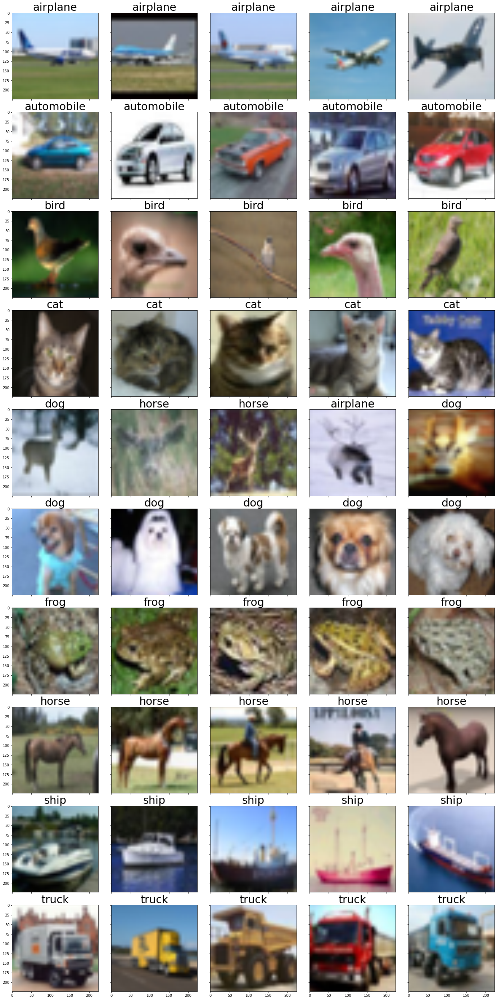

In [ ]:
#Plotting Top 5 correct predictions in each class
fig = plt.figure(figsize=(50., 50.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(10, 5),  
                 axes_pad=0.5, 
                 )

for ax, row in zip(grid,df_best.iterrows() ):  
    ax.imshow(np.transpose(row[1]["image"],(1, 2, 0)))
    ax.set_title(mapping_dict[row[1]["prediction"]],{"fontsize":30})
plt.show()



##**Plotting Images for Top 5 worst predictions in each class and respective predicted labels **

In [ ]:
#Top 5 worst predictions in each class
df_worst

,label,prediction,probability,image
0,0,8,2.488501e-11,"[[[0.52156866, 0.52156866, 0.52156866, 0.52156..."
1,0,2,4.022003e-07,"[[[0.0, 0.0, 0.0, 0.0, 0.0039215684, 0.0117647..."
2,0,7,1.934567e-06,"[[[0.64705884, 0.64705884, 0.64705884, 0.64705..."
3,0,7,3.573757e-06,"[[[0.4392157, 0.4392157, 0.4392157, 0.4392157,..."
4,0,9,4.687464e-06,"[[[0.9490196, 0.9490196, 0.9490196, 0.9490196,..."
1000,1,7,1.094018e-08,"[[[0.7490196, 0.7490196, 0.7490196, 0.7490196,..."
1001,1,9,3.737819e-07,"[[[0.87058824, 0.87058824, 0.87058824, 0.87058..."
1002,1,0,8.269527e-07,"[[[0.7411765, 0.7411765, 0.7411765, 0.7411765,..."
1003,1,9,9.737106e-07,"[[[0.5647059, 0.5647059, 0.5647059, 0.5647059,..."
1004,1,9,2.226702e-06,"[[[0.49019608, 0.49019608, 0.49019608, 0.49019..."


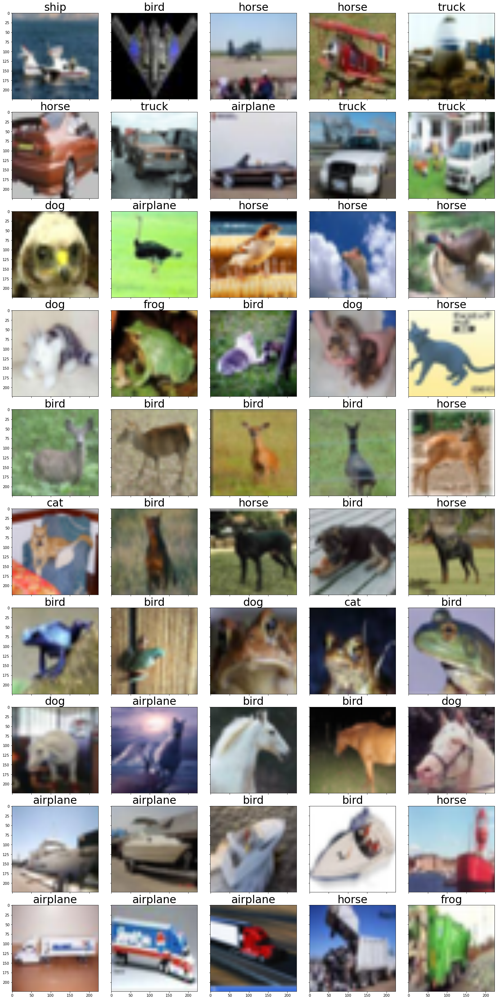

In [ ]:
fig = plt.figure(figsize=(50., 50.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(10, 5),  
                 axes_pad=0.5, 
                 )

for ax, row in zip(grid,df_worst.iterrows() ):  
    ax.imshow(np.transpose(row[1]["image"],(1, 2, 0)))
    ax.set_title(mapping_dict[row[1]["prediction"]],{"fontsize":30})

plt.axis("off")
plt.show()

So with the Finetuning the from the Resnet18 model parameters we have achieved Test accuracy of 80.96% on CIFAR10. Optimizer used is Adam with Learning rate of 0.01 and 15 epochs

###**Comparing the performance of finetuning Resnet18 model’s parameters versus using Resnet18 extracted features.**
In part 2-feature extraction the accuracy was less than part 3-fine tuning Resnet18's model parameters, as in feature extraction only the weights of the last layer were getting updated when we were running multiple epochs while training the model. We saw an improved version with better accuracy on fine tuning Resnet's model parameters as in this case all the weight layers were getting updated while training the model on CIFAR dataset and Resnet18 model's weight layers are trained much accurately to fit the CIFAR10 dataset . Fine tuning model parameters also performed better because we used a very small learning rate which does not distort the already initialized weights too quickly.
